In [33]:
from pathlib import Path

# ===============================
# 📁 BASE PATH SETUP
# ===============================
BASE = Path(r"C:/Users/telso/Downloads/the-blind-flight-synapse-drive-ps-1/SynapseDrive_Dataset")

TRAIN_IMG = BASE / "train" / "images"
TRAIN_LBL = BASE / "train" / "labels"
TRAIN_VEL = BASE / "train" / "velocities"
TEST_IMG  = BASE / "test" / "images"
TEST_VEL  = BASE / "test" / "velocities"

# ✅ Verify all folders exist
for p in [TRAIN_IMG, TRAIN_LBL, TRAIN_VEL, TEST_IMG, TEST_VEL]:
    if not p.exists():
        print(f"⚠️ Missing folder: {p}")
    else:
        print(f"✅ Found: {p}")


✅ Found: C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset\train\images
✅ Found: C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset\train\labels
✅ Found: C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset\train\velocities
✅ Found: C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset\test\images
✅ Found: C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset\test\velocities


In [34]:
import os

print(f"Train images    : {len(os.listdir(TRAIN_IMG))}")
print(f"Train labels    : {len(os.listdir(TRAIN_LBL))}")
print(f"Train velocities: {len(os.listdir(TRAIN_VEL))}")


Train images    : 20
Train labels    : 20
Train velocities: 20


In [35]:
import os

print("Train images    :", len(os.listdir(TRAIN_IMG)))
print("Train labels    :", len(os.listdir(TRAIN_LBL)))
print("Train velocities:", len(os.listdir(TRAIN_VEL)))

Train images    : 20
Train labels    : 20
Train velocities: 20


📦 Example file: 0016.png
🖼️ Image shape   : (1385, 1385, 3)
📋 Label shape   : (20, 20)
🌪️ Velocity shape: (20, 20)


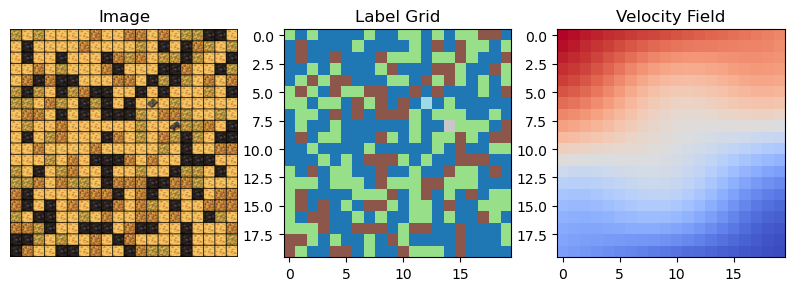

In [36]:
import json
import numpy as np
import cv2
import random

# pick one random training file
fname = random.choice([f for f in os.listdir(TRAIN_IMG) if f.endswith(".png")])
print(f"📦 Example file: {fname}")

# load image
img_path = TRAIN_IMG / fname
img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# load label grid
label_path = TRAIN_LBL / fname.replace(".png", ".json")
with open(label_path, "r") as f:
    data = json.load(f)
label = np.array(data.get("grid", []), dtype=np.int64)

# load velocity field
vel_path = TRAIN_VEL / fname.replace(".png", ".json")
with open(vel_path, "r") as f:
    vel_data = json.load(f)
velocity = np.array(vel_data.get("boost", []), dtype=np.float32)

print(f"🖼️ Image shape   : {img.shape}")
print(f"📋 Label shape   : {label.shape}")
print(f"🌪️ Velocity shape: {velocity.shape}")

# quick sanity check visualization
import matplotlib.pyplot as plt
plt.figure(figsize=(10,3))
plt.subplot(1,3,1); plt.imshow(img); plt.title("Image"); plt.axis("off")
plt.subplot(1,3,2); plt.imshow(label, cmap='tab20'); plt.title("Label Grid")
plt.subplot(1,3,3); plt.imshow(velocity, cmap='coolwarm'); plt.title("Velocity Field")
plt.show()


In [37]:
import json
import cv2
import numpy as np
from pathlib import Path

X_terrain, y_terrain = [], []

image_files = sorted([f for f in os.listdir(TRAIN_IMG) if f.endswith(".png")])

for fname in image_files:
    img_path = Path(TRAIN_IMG) / fname
    lbl_path = Path(TRAIN_LBL) / fname.replace(".png", ".json")

    if not lbl_path.exists():
        print(f"⚠️ Missing label for {fname}, skipping.")
        continue

    # Load image
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"⚠️ Could not load image {fname}")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load terrain label safely
    with open(lbl_path, "r") as f:
        data = json.load(f)
    terrain = data.get("terrain", None)

    if terrain is None:
        print(f"⚠️ No terrain info in {fname}")
        continue

    # Feature extraction (mean + std)
    mean_rgb = img.mean(axis=(0, 1))
    std_rgb  = img.std(axis=(0, 1))
    feat = np.concatenate([mean_rgb, std_rgb])

    X_terrain.append(feat)
    y_terrain.append(terrain)

X_terrain = np.array(X_terrain)
y_terrain = np.array(y_terrain)

print("✅ Terrain feature matrix shape:", X_terrain.shape)
print("✅ Terrain labels shape        :", y_terrain.shape)
print("🌍 Unique terrains found       :", set(y_terrain))


✅ Terrain feature matrix shape: (20, 6)
✅ Terrain labels shape        : (20,)
🌍 Unique terrains found       : {np.str_('desert'), np.str_('lab'), np.str_('forest')}


In [38]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
import numpy as np

# Build pipeline (scaling + KNN)
terrain_model = Pipeline([
    ("scaler", StandardScaler()),  # normalize mean/std features
    ("knn", KNeighborsClassifier(n_neighbors=5, weights="distance"))
])

# Cross-validation to verify stability
scores = cross_val_score(terrain_model, X_terrain, y_terrain, cv=3)

terrain_model.fit(X_terrain, y_terrain)

print("✅ Terrain identification model trained")
print(f"📊 Cross-val accuracy: {np.mean(scores):.3f} ± {np.std(scores):.3f}")


✅ Terrain identification model trained
📊 Cross-val accuracy: 1.000 ± 0.000


c:\Users\telso\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:805: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=3.
  warnings.warn(


In [39]:
import random

# pick a random example to test
idx = random.randint(0, len(X_terrain) - 1)
test_feat = X_terrain[idx].reshape(1, -1)

pred = terrain_model.predict(test_feat)[0]
true = y_terrain[idx]

print(f"🧩 Testing terrain prediction on sample {idx}:")
print(f"  ├─ Predicted: {pred}")
print(f"  └─ True:      {true}")

if pred == true:
    print("✅ Correct prediction!")
else:
    print("❌ Mismatch — model may need tuning.")


🧩 Testing terrain prediction on sample 10:
  ├─ Predicted: forest
  └─ True:      forest
✅ Correct prediction!


In [40]:
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# Get predictions for all features
preds = terrain_model.predict(X_terrain)
acc = accuracy_score(y_terrain, preds)

print(f"✅ Terrain classifier accuracy: {acc*100:.2f}%")
print("\nDetailed report:")
print(classification_report(y_terrain, preds, digits=3))

# Display mismatched predictions only
mismatches = np.where(preds != y_terrain)[0]
if len(mismatches) > 0:
    print(f"\n⚠️ {len(mismatches)} mismatches found:")
    for i in mismatches:
        print(f"  Sample {i:02d} → Predicted: {preds[i]}, True: {y_terrain[i]}")
else:
    print("\n🎯 Perfect classification on training data!")


✅ Terrain classifier accuracy: 100.00%

Detailed report:
              precision    recall  f1-score   support

      desert      1.000     1.000     1.000        10
      forest      1.000     1.000     1.000         8
         lab      1.000     1.000     1.000         2

    accuracy                          1.000        20
   macro avg      1.000     1.000     1.000        20
weighted avg      1.000     1.000     1.000        20


🎯 Perfect classification on training data!


In [41]:
import os
import numpy as np

# Ensure image order matches feature order
image_files = sorted([f for f in os.listdir(TRAIN_IMG) if f.endswith(".png")])

correct = 0
total = len(y_terrain)

print("🧭 Image-wise terrain prediction results:\n")
print(f"{'Filename':<15} | {'Predicted':<8} | {'True':<8} | Status")
print("-"*45)

for i, fname in enumerate(image_files):
    feat = X_terrain[i].reshape(1, -1)
    
    pred = terrain_model.predict(feat)[0]
    true = y_terrain[i]
    
    status = "✓" if pred == true else "✗"
    print(f"{fname:<15} | {pred:<8} | {true:<8} | {status}")
    
    if pred == true:
        correct += 1

accuracy = correct / total
print("\n✅ Accuracy:", f"{correct}/{total} =", f"{accuracy*100:.2f}%")


🧭 Image-wise terrain prediction results:

Filename        | Predicted | True     | Status
---------------------------------------------
0001.png        | desert   | desert   | ✓
0002.png        | forest   | forest   | ✓
0003.png        | forest   | forest   | ✓
0004.png        | forest   | forest   | ✓
0005.png        | desert   | desert   | ✓
0006.png        | desert   | desert   | ✓
0007.png        | forest   | forest   | ✓
0008.png        | desert   | desert   | ✓
0009.png        | desert   | desert   | ✓
0010.png        | desert   | desert   | ✓
0011.png        | forest   | forest   | ✓
0012.png        | lab      | lab      | ✓
0013.png        | desert   | desert   | ✓
0014.png        | desert   | desert   | ✓
0015.png        | forest   | forest   | ✓
0016.png        | desert   | desert   | ✓
0017.png        | lab      | lab      | ✓
0018.png        | forest   | forest   | ✓
0019.png        | desert   | desert   | ✓
0020.png        | forest   | forest   | ✓

✅ Accuracy: 20/20 = 100

🖼️ Displaying 10 random test images:



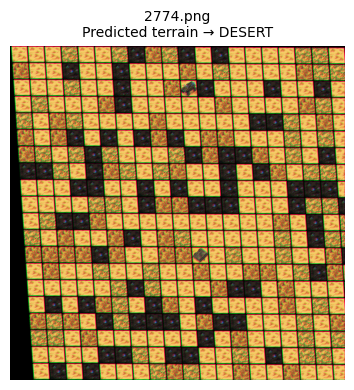

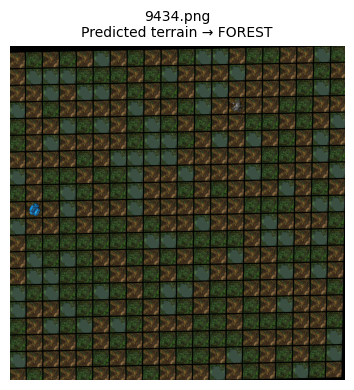

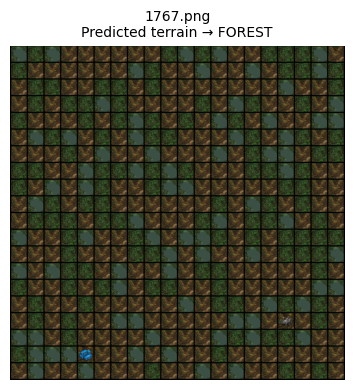

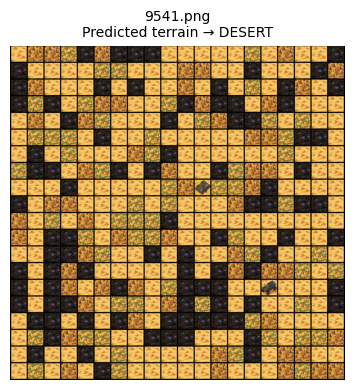

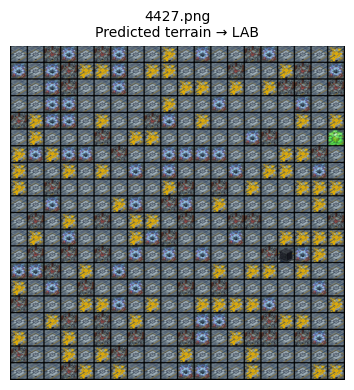

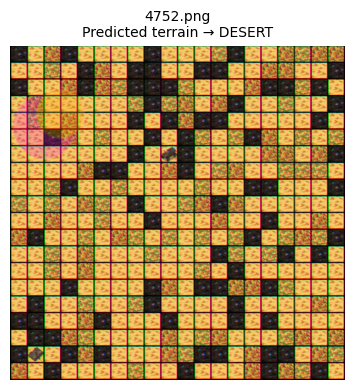

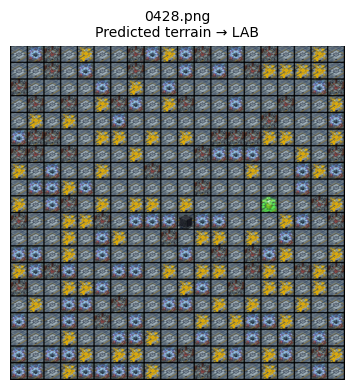

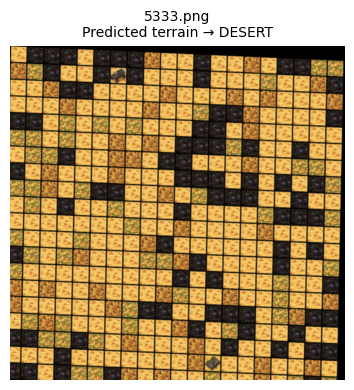

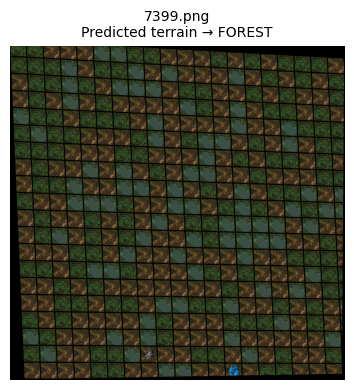

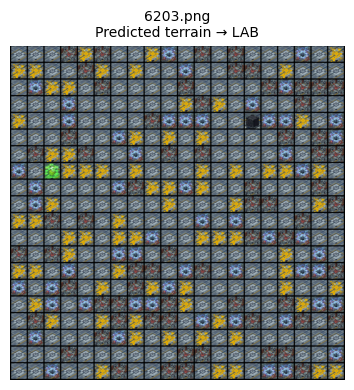

In [42]:
import random
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from pathlib import Path

# Define test image directory
TEST_IMG_DIR = Path(BASE) / "test" / "images"

# Pick up to 10 random test images (handles smaller sets gracefully)
test_imgs = [f for f in os.listdir(TEST_IMG_DIR) if f.endswith(".png")]
sample_imgs = random.sample(test_imgs, min(10, len(test_imgs)))

print(f"🖼️ Displaying {len(sample_imgs)} random test images:\n")

for fname in sample_imgs:
    img_path = TEST_IMG_DIR / fname

    # Load image safely
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"⚠️ Could not load {fname}, skipping.")
        continue

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Extract features (mean + std)
    mean_rgb = img.mean(axis=(0,1))
    std_rgb  = img.std(axis=(0,1))
    feat = np.concatenate([mean_rgb, std_rgb]).reshape(1, -1)

    # Predict terrain
    pred = terrain_model.predict(feat)[0]

    # Display
    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.title(f"{fname}\nPredicted terrain → {pred.upper()}", fontsize=10)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


In [43]:
import json
import cv2
import numpy as np
from pathlib import Path

# Initialize terrain containers
desert_data, forest_data, lab_data = [], [], []

# Convert base paths to Path objects
TRAIN_IMG = Path(TRAIN_IMG)
TRAIN_LBL = Path(TRAIN_LBL)
TRAIN_VEL = Path(TRAIN_VEL)

# Iterate over image files
for fname in sorted(TRAIN_IMG.glob("*.png")):
    image_id = fname.stem

    # --- Load image ---
    img = cv2.imread(str(fname))
    if img is None:
        print(f"⚠️ Skipping unreadable image {fname.name}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # --- Load label JSON ---
    label_path = TRAIN_LBL / f"{image_id}.json"
    if not label_path.exists():
        print(f"⚠️ Missing label for {image_id}")
        continue

    with open(label_path, "r") as f:
        label_data = json.load(f)

    terrain = label_data.get("terrain", None)
    grid = np.array(label_data.get("grid", []), dtype=int)

    if terrain is None:
        print(f"⚠️ No terrain info for {image_id}")
        continue

    # --- Load velocity JSON ---
    vel_path = TRAIN_VEL / f"{image_id}.json"
    with open(vel_path, "r") as f:
        vel_data = json.load(f)
    velocity = np.array(vel_data.get("boost", []), dtype=float)

    # --- Store structured sample ---
    sample = {
        "image": img,
        "grid": grid,
        "velocity": velocity,
        "image_id": image_id
    }

    if terrain == "desert":
        desert_data.append(sample)
    elif terrain == "forest":
        forest_data.append(sample)
    elif terrain == "lab":
        lab_data.append(sample)

print(f"🏜️ Desert samples: {len(desert_data)}")
print(f"🌲 Forest samples: {len(forest_data)}")
print(f"🧪 Lab samples   : {len(lab_data)}")


🏜️ Desert samples: 10
🌲 Forest samples: 8
🧪 Lab samples   : 2


In [44]:
import numpy as np

# --- Feature extraction helper ---
def extract_tile_features(img, grid, tile_size):
    """Extract per-tile mean/std features and labels."""
    X, y = [], []
    for i in range(20):
        for j in range(20):
            tile = img[
                i*tile_size:(i+1)*tile_size,
                j*tile_size:(j+1)*tile_size
            ]

            if tile.size == 0:  # skip invalid crops
                continue

            mean_rgb = tile.mean(axis=(0,1))
            std_rgb  = tile.std(axis=(0,1))
            feat = np.concatenate([mean_rgb, std_rgb])

            X.append(feat)
            y.append(grid[i, j])

    return np.array(X, dtype=np.float32), np.array(y, dtype=np.int64)


# --- Build desert dataset ---
X_desert, y_desert = [], []
tile_size = desert_data[0]["image"].shape[0] // 20

for sample in desert_data:
    img, grid = sample["image"], sample["grid"]
    X_tile, y_tile = extract_tile_features(img, grid, tile_size)
    X_desert.append(X_tile)
    y_desert.append(y_tile)

# --- Stack all samples ---
X_desert = np.vstack(X_desert)
y_desert = np.hstack(y_desert)

print("🏜️ Desert tile features:", X_desert.shape)
print("🏜️ Desert tile labels  :", y_desert.shape)
print("Unique classes:", np.unique(y_desert))


🏜️ Desert tile features: (4000, 6)
🏜️ Desert tile labels  : (4000,)
Unique classes: [0 1 2 3 4]


In [45]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
import numpy as np

# --- Build KNN pipeline with scaling ---
desert_tile_model = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier(
        n_neighbors=5,
        weights="distance",     # closer tiles count more
        metric="euclidean"
    ))
])

# --- Optional cross-validation to check consistency ---
scores = cross_val_score(desert_tile_model, X_desert, y_desert, cv=3)
desert_tile_model.fit(X_desert, y_desert)

print("🏜️ Desert tile-class KNN model trained successfully")
print(f"📊 Cross-val accuracy: {np.mean(scores):.3f} ± {np.std(scores):.3f}")


🏜️ Desert tile-class KNN model trained successfully
📊 Cross-val accuracy: 1.000 ± 0.000


🏜️ Desert tile classification accuracy: 1.0000


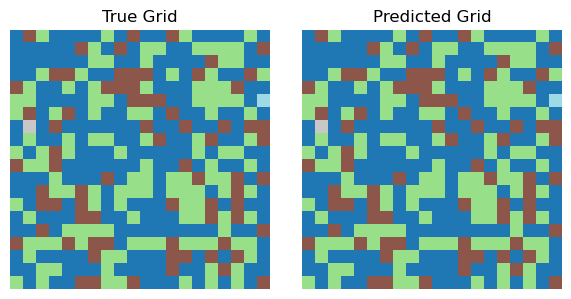

In [46]:
import numpy as np

def predict_class_grid(img, model, tile_size):
    """Predict a 20x20 class grid for a given image using the provided KNN model."""
    grid_pred = np.zeros((20, 20), dtype=int)
    for i in range(20):
        for j in range(20):
            tile = img[
                i*tile_size:(i+1)*tile_size,
                j*tile_size:(j+1)*tile_size
            ]
            if tile.size == 0:
                continue  # skip invalid tile

            mean = tile.mean(axis=(0,1))
            std  = tile.std(axis=(0,1))
            feat = np.concatenate([mean, std]).reshape(1, -1)
            grid_pred[i, j] = model.predict(feat)[0]

    return grid_pred


# --- Run prediction for one desert sample ---
sample = desert_data[0]
img, true_grid = sample["image"], sample["grid"]
tile_size = img.shape[0] // 20

pred_grid = predict_class_grid(img, desert_tile_model, tile_size)

# --- Evaluate accuracy ---
accuracy = (pred_grid == true_grid).mean()
print(f"🏜️ Desert tile classification accuracy: {accuracy:.4f}")

# --- Optional: visualize result overlay ---
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1)
plt.imshow(true_grid, cmap="tab20")
plt.title("True Grid")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(pred_grid, cmap="tab20")
plt.title("Predicted Grid")
plt.axis("off")

plt.tight_layout()
plt.show()


In [47]:
import numpy as np

def build_tile_dataset(terrain_data, terrain_name):
    """Extract per-tile features (mean + std) and labels from given terrain dataset."""
    X, y = [], []
    if len(terrain_data) == 0:
        print(f"⚠️ No data found for {terrain_name}")
        return np.empty((0, 6)), np.empty((0,))

    tile_size = terrain_data[0]["image"].shape[0] // 20

    for sample in terrain_data:
        img, grid = sample["image"], sample["grid"]
        for i in range(20):
            for j in range(20):
                tile = img[
                    i*tile_size:(i+1)*tile_size,
                    j*tile_size:(j+1)*tile_size
                ]
                if tile.size == 0:
                    continue  # skip invalid crops

                mean_rgb = tile.mean(axis=(0,1))
                std_rgb  = tile.std(axis=(0,1))
                feat = np.concatenate([mean_rgb, std_rgb])

                X.append(feat)
                y.append(grid[i, j])

    X, y = np.array(X, dtype=np.float32), np.array(y, dtype=np.int64)
    print(f"🌲 {terrain_name.capitalize()} — Features: {X.shape}, Labels: {y.shape}, Unique classes: {np.unique(y)}")
    return X, y


# --- Build dataset for forest ---
X_forest, y_forest = build_tile_dataset(forest_data, "forest")


🌲 Forest — Features: (3200, 6), Labels: (3200,), Unique classes: [0 1 2 3 4]


In [48]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
import numpy as np

# --- Build KNN pipeline with scaling ---
forest_tile_model = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier(
        n_neighbors=5,
        weights="distance",  # closer tiles count more
        metric="euclidean"
    ))
])

# --- Optional: quick CV check (3 folds for small data) ---
scores = cross_val_score(forest_tile_model, X_forest, y_forest, cv=3)
forest_tile_model.fit(X_forest, y_forest)

print("🌳 Forest tile-class KNN model trained successfully")
print(f"📊 Cross-val accuracy: {np.mean(scores):.3f} ± {np.std(scores):.3f}")


🌳 Forest tile-class KNN model trained successfully
📊 Cross-val accuracy: 1.000 ± 0.000


✅ Forest tile classification accuracy: 1.0000


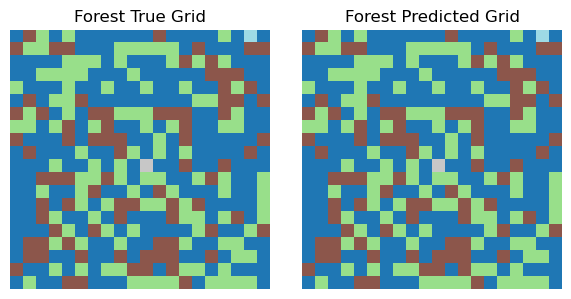

In [49]:
import numpy as np
import matplotlib.pyplot as plt

def evaluate_tile_model(sample, model, terrain_name):
    """Predict the 20x20 grid for one terrain sample and compute accuracy."""
    img, true_grid = sample["image"], sample["grid"]
    tile_size = img.shape[0] // 20

    pred_grid = np.zeros((20, 20), dtype=int)
    for i in range(20):
        for j in range(20):
            tile = img[
                i*tile_size:(i+1)*tile_size,
                j*tile_size:(j+1)*tile_size
            ]
            if tile.size == 0:
                continue

            mean = tile.mean(axis=(0,1))
            std  = tile.std(axis=(0,1))
            feat = np.concatenate([mean, std]).reshape(1, -1)
            pred_grid[i, j] = model.predict(feat)[0]

    # --- Accuracy ---
    accuracy = (pred_grid == true_grid).mean()
    print(f"✅ {terrain_name.capitalize()} tile classification accuracy: {accuracy:.4f}")

    # --- Optional visualization ---
    plt.figure(figsize=(6,3))
    plt.subplot(1,2,1)
    plt.imshow(true_grid, cmap="tab20")
    plt.title(f"{terrain_name.capitalize()} True Grid")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(pred_grid, cmap="tab20")
    plt.title(f"{terrain_name.capitalize()} Predicted Grid")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return pred_grid, accuracy


# --- Test it on a forest sample ---
sample = forest_data[0]
pred_grid, acc = evaluate_tile_model(sample, forest_tile_model, "forest")


In [50]:
import numpy as np

def build_lab_tile_dataset(lab_data):
    """Extract features (mean, std, gray mean/std) for LAB terrain."""
    X, y = [], []
    if len(lab_data) == 0:
        print("⚠️ No lab data found")
        return np.empty((0, 8)), np.empty((0,))

    tile_size = lab_data[0]["image"].shape[0] // 20

    for sample in lab_data:
        img, grid = sample["image"], sample["grid"]
        for i in range(20):
            for j in range(20):
                tile = img[
                    i*tile_size:(i+1)*tile_size,
                    j*tile_size:(j+1)*tile_size
                ]
                if tile.size == 0:
                    continue

                # --- RGB features ---
                mean_rgb = tile.mean(axis=(0,1))
                std_rgb  = tile.std(axis=(0,1))

                # --- Grayscale texture ---
                gray = np.mean(tile, axis=2)
                mean_gray, std_gray = gray.mean(), gray.std()

                # --- Combined feature vector (8D) ---
                feat = np.concatenate([mean_rgb, std_rgb, [mean_gray, std_gray]])
                X.append(feat)
                y.append(grid[i, j])

    X, y = np.array(X, dtype=np.float32), np.array(y, dtype=np.int64)
    print(f"🧪 LAB dataset built — Features: {X.shape}, Labels: {y.shape}")
    print("Class distribution:", dict(zip(*np.unique(y, return_counts=True))))
    return X, y


# --- Build LAB dataset ---
X_lab, y_lab = build_lab_tile_dataset(lab_data)


🧪 LAB dataset built — Features: (800, 8), Labels: (800,)
Class distribution: {np.int64(0): np.int64(418), np.int64(1): np.int64(219), np.int64(2): np.int64(159), np.int64(3): np.int64(2), np.int64(4): np.int64(2)}


In [51]:
from sklearn.utils import resample
import numpy as np

def balance_dataset(X, y, random_state=42):
    """Balances all classes in (X, y) by oversampling minority classes."""
    unique_classes, counts = np.unique(y, return_counts=True)
    max_count = counts.max()
    
    X_bal, y_bal = [], []

    for cls in unique_classes:
        X_cls = X[y == cls]
        y_cls = y[y == cls]

        if len(X_cls) < max_count:
            X_res, y_res = resample(
                X_cls, y_cls,
                replace=True,
                n_samples=max_count,
                random_state=random_state
            )
        else:
            X_res, y_res = X_cls, y_cls

        X_bal.append(X_res)
        y_bal.append(y_res)

    X_out = np.vstack(X_bal)
    y_out = np.hstack(y_bal)

    print("✅ Dataset balanced successfully")
    print("Class distribution after balancing:",
          dict(zip(*np.unique(y_out, return_counts=True))))
    return X_out, y_out


# --- Apply to LAB dataset ---
X_lab_bal, y_lab_bal = balance_dataset(X_lab, y_lab)
print("Balanced dataset shape:", X_lab_bal.shape)


✅ Dataset balanced successfully
Class distribution after balancing: {np.int64(0): np.int64(418), np.int64(1): np.int64(418), np.int64(2): np.int64(418), np.int64(3): np.int64(418), np.int64(4): np.int64(418)}
Balanced dataset shape: (2090, 8)


In [52]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
import numpy as np

# --- Build scaled + distance-weighted KNN model ---
lab_tile_model = Pipeline([
    ("scaler", StandardScaler()),
    ("knn", KNeighborsClassifier(
        n_neighbors=3,
        weights="distance",
        metric="euclidean"
    ))
])

# --- Quick 3-fold CV check (optional diagnostic) ---
scores = cross_val_score(lab_tile_model, X_lab_bal, y_lab_bal, cv=3, n_jobs=-1)
lab_tile_model.fit(X_lab_bal, y_lab_bal)

print("🧪 LAB KNN model trained successfully (balanced, distance-weighted)")
print(f"📊 Cross-val accuracy: {np.mean(scores):.3f} ± {np.std(scores):.3f}")


🧪 LAB KNN model trained successfully (balanced, distance-weighted)
📊 Cross-val accuracy: 1.000 ± 0.000


In [53]:
import numpy as np

def evaluate_tile_model(model, sample, terrain="lab"):
    """
    Evaluate tile classification accuracy for one terrain sample.
    Works for lab, forest, or desert models.
    """
    img, true_grid = sample["image"], sample["grid"]
    tile_size = img.shape[0] // 20
    pred_grid = np.zeros((20, 20), dtype=int)

    for i in range(20):
        for j in range(20):
            tile = img[i*tile_size:(i+1)*tile_size, j*tile_size:(j+1)*tile_size]
            mean_rgb = tile.mean(axis=(0, 1))
            std_rgb = tile.std(axis=(0, 1))

            # Add grayscale features for lab terrain
            if terrain == "lab":
                gray = np.mean(tile, axis=2)
                feat = np.concatenate([mean_rgb, std_rgb, [gray.mean(), gray.std()]])
            else:
                feat = np.concatenate([mean_rgb, std_rgb])

            pred_grid[i, j] = model.predict(feat.reshape(1, -1))[0]

    accuracy = (pred_grid == true_grid).mean()

    start_positions = np.argwhere(pred_grid == 3)
    goal_positions = np.argwhere(pred_grid == 4)

    print(f"🏁 {terrain.upper()} tile accuracy: {accuracy:.4f}")
    print("Predicted START positions:", start_positions if len(start_positions) else "None")
    print("Predicted GOAL positions :", goal_positions if len(goal_positions) else "None")

    return pred_grid, accuracy


# --- Run evaluation for LAB ---
pred_grid_lab, lab_acc = evaluate_tile_model(lab_tile_model, lab_data[1], terrain="lab")


🏁 LAB tile accuracy: 1.0000
Predicted START positions: [[19  8]]
Predicted GOAL positions : [[15 18]]


In [54]:
# =========================================================
# UNIVERSAL COST GRID BUILDER (for all terrains)
# =========================================================
BASE_COSTS = {
    "desert": {0: 1.2, 1: 1e9, 2: 3.7, 3: 1.2, 4: 2.2},
    "forest": {0: 1.5, 1: 1e9, 2: 2.8, 3: 1.5, 4: 2.5},
    "lab":    {0: 1.0, 1: 1e9, 2: 3.0, 3: 1.0, 4: 2.0}
}

def build_cost_grid_general(class_grid: np.ndarray, velocity_grid: np.ndarray, terrain: str) -> np.ndarray:
    """
    Builds a 20x20 cost grid from predicted tile classes and velocity boosts.
    Uses terrain-specific base costs and applies vectorized operations.
    """
    base_costs = BASE_COSTS[terrain]
    cost_grid = np.zeros_like(velocity_grid, dtype=float)

    # Vectorized mapping: apply cost for each class
    for cls_id, base_val in base_costs.items():
        cost_grid[class_grid == cls_id] = base_val

    # Apply velocity boost adjustment
    cost_grid -= velocity_grid
    return cost_grid


In [55]:
import numpy as np

def find_start_goal_safe(class_grid: np.ndarray, velocity_grid: np.ndarray):
    """
    Robustly locate start (class 3) and goal (class 4) tiles.
    If either is missing, fall back to a walkable tile with favorable velocity.
    """
    start_pos = np.argwhere(class_grid == 3)
    goal_pos  = np.argwhere(class_grid == 4)
    walkable  = np.argwhere(class_grid != 1)  # anything but wall

    # --- START fallback ---
    if len(start_pos):
        start = tuple(start_pos[0])
    else:
        # pick highest positive velocity (cheaper entry)
        k = np.argmax(velocity_grid[walkable[:, 0], walkable[:, 1]])
        start = tuple(walkable[k])
        print("⚠️ Start missing → fallback tile used:", start)

    # --- GOAL fallback ---
    if len(goal_pos):
        goal = tuple(goal_pos[0])
    else:
        # pick lowest velocity (harder target)
        k = np.argmin(velocity_grid[walkable[:, 0], walkable[:, 1]])
        goal = tuple(walkable[k])
        print("⚠️ Goal missing → fallback tile used:", goal)

    return start, goal


In [56]:
import heapq

def dijkstra(cost_grid, start, goal):
    """
    Fast and safe Dijkstra path planner for 20x20 tile grids.
    Returns (path_string, total_cost).
    """
    moves = {'u': (-1, 0), 'd': (1, 0), 'l': (0, -1), 'r': (0, 1)}
    pq = [(0.0, start, [])]  # store path as list for efficiency
    visited = set()
    height, width = cost_grid.shape

    while pq:
        curr_cost, (x, y), path = heapq.heappop(pq)

        if (x, y) in visited:
            continue
        visited.add((x, y))

        # --- Goal reached ---
        if (x, y) == goal:
            return ''.join(path), curr_cost

        # --- Expand neighbors ---
        for move, (dx, dy) in moves.items():
            nx, ny = x + dx, y + dy
            if 0 <= nx < height and 0 <= ny < width:
                tile_cost = cost_grid[nx, ny]
                if tile_cost < 1e8:  # ignore walls
                    heapq.heappush(
                        pq,
                        (curr_cost + tile_cost, (nx, ny), path + [move])
                    )

    # --- No path found ---
    print("⚠️ No valid path found — fallback required")
    return "", float("inf")


In [57]:
# =========================================================
# BASE MOVEMENT COSTS PER TERRAIN
# =========================================================
BASE_COSTS = {
    "desert": {  # Desert has slower sand and rougher terrain
        0: 1.2,   # Plain
        1: 1e9,   # Wall
        2: 3.7,   # Rough dune
        3: 1.2,   # Start
        4: 2.2    # Goal
    },
    "forest": {  # Denser but more stable
        0: 1.5,
        1: 1e9,
        2: 2.8,
        3: 1.5,
        4: 2.5
    },
    "lab": {     # Smooth artificial terrain
        0: 1.0,
        1: 1e9,
        2: 3.0,
        3: 1.0,
        4: 2.0
    }
}


In [58]:
# =========================================================
# UNIVERSAL COST GRID BUILDER
# =========================================================
def build_cost_grid_general(class_grid, velocity_grid, terrain):
    """
    Builds a cost grid for any terrain.
    Combines terrain base costs and local velocity bonuses.
    """
    import numpy as np
    cost = np.zeros_like(velocity_grid, dtype=float)
    base = BASE_COSTS[terrain]

    for cls, base_cost in base.items():
        cost[class_grid == cls] = base_cost

    # Subtract velocity (higher boost = lower cost)
    cost -= velocity_grid
    return cost


# =========================================================
# SAFE START + GOAL FINDER
# =========================================================
import numpy as np

def find_start_goal_safe(class_grid: np.ndarray, velocity_grid: np.ndarray):
    """
    Robustly locate start (class 3) and goal (class 4) tiles.
    If either is missing, fall back to a walkable tile with favorable velocity.
    """
    start_pos = np.argwhere(class_grid == 3)
    goal_pos  = np.argwhere(class_grid == 4)
    walkable  = np.argwhere(class_grid != 1)  # anything but wall

    # --- START fallback ---
    if len(start_pos):
        start = tuple(start_pos[0])
    else:
        # pick highest positive velocity (cheaper entry)
        k = np.argmax(velocity_grid[walkable[:, 0], walkable[:, 1]])
        start = tuple(walkable[k])
        print("⚠️ Start missing → fallback tile used:", start)

    # --- GOAL fallback ---
    if len(goal_pos):
        goal = tuple(goal_pos[0])
    else:
        # pick lowest velocity (harder target)
        k = np.argmin(velocity_grid[walkable[:, 0], walkable[:, 1]])
        goal = tuple(walkable[k])
        print("⚠️ Goal missing → fallback tile used:", goal)

    return start, goal


In [59]:
import numpy as np

def test_pathfinding_pipeline(sample, model, terrain_name):
    """
    Test one terrain model end-to-end:
      - Predict tile grid
      - Build cost grid
      - Find start & goal safely
      - Run Dijkstra
      - Return path & total cost
    """
    img, velocity = sample["image"], sample["velocity"]
    tile_size = img.shape[0] // 20

    # --- Predict class grid ---
    pred_grid = np.zeros((20, 20), dtype=int)
    for i in range(20):
        for j in range(20):
            tile = img[i*tile_size:(i+1)*tile_size, j*tile_size:(j+1)*tile_size]
            mean = tile.mean(axis=(0,1))
            std  = tile.std(axis=(0,1))
            feat = np.concatenate([mean, std]).reshape(1, -1)
            pred_grid[i, j] = model.predict(feat)[0]

    # --- Build cost grid ---
    cost_grid = build_cost_grid_general(pred_grid, velocity, terrain_name)

    # --- Find start & goal (safe fallback) ---
    start, goal = find_start_goal_safe(pred_grid, velocity)

    # --- Run Dijkstra ---
    path, total_cost = dijkstra(cost_grid, start, goal)

    # --- Fallback if path empty ---
    if not path:
        print(f"⚠️ Empty path in {terrain_name} → applying straight-line fallback")
        sx, sy = start
        gx, gy = goal
        fallback = []
        while sy < gy: fallback.append('r'); sy += 1
        while sy > gy: fallback.append('l'); sy -= 1
        while sx < gx: fallback.append('d'); sx += 1
        while sx > gx: fallback.append('u'); sx -= 1
        path = ''.join(fallback)
        total_cost = np.inf

    # --- Reporting ---
    print(f"🗺️  Terrain: {terrain_name.upper()}")
    print(f"Start: {start} | Goal: {goal}")
    print(f"Path length: {len(path)} | Total cost: {total_cost:.2f}")
    print("="*50)

    return pred_grid, cost_grid, path, total_cost


# --- Test it on a desert sample ---
pred_grid_desert, cost_grid_desert, path_desert, cost_desert = test_pathfinding_pipeline(
    desert_data[0],
    desert_tile_model,
    terrain_name="desert"
)


🗺️  Terrain: DESERT
Start: (np.int64(7), np.int64(1)) | Goal: (np.int64(5), np.int64(19))
Path length: 20 | Total cost: 36.23


In [60]:
import numpy as np

def test_pathfinding_pipeline(sample, model, terrain_name):
    """
    Test one terrain model end-to-end:
      - Predict tile grid
      - Build cost grid
      - Find start & goal safely
      - Run Dijkstra
      - Return path & total cost
    """
    img, velocity = sample["image"], sample["velocity"]
    tile_size = img.shape[0] // 20

    # --- Predict class grid ---
    pred_grid = np.zeros((20, 20), dtype=int)
    for i in range(20):
        for j in range(20):
            tile = img[i*tile_size:(i+1)*tile_size, j*tile_size:(j+1)*tile_size]
            mean = tile.mean(axis=(0,1))
            std  = tile.std(axis=(0,1))
            feat = np.concatenate([mean, std]).reshape(1, -1)
            pred_grid[i, j] = model.predict(feat)[0]

    # --- Build cost grid ---
    cost_grid = build_cost_grid_general(pred_grid, velocity, terrain_name)

    # --- Find start & goal (safe fallback) ---
    start, goal = find_start_goal_safe(pred_grid, velocity)

    # --- Run Dijkstra ---
    path, total_cost = dijkstra(cost_grid, start, goal)

    # --- Fallback if path empty ---
    if not path:
        print(f"⚠️ Empty path in {terrain_name} → applying straight-line fallback")
        sx, sy = start
        gx, gy = goal
        fallback = []
        while sy < gy: fallback.append('r'); sy += 1
        while sy > gy: fallback.append('l'); sy -= 1
        while sx < gx: fallback.append('d'); sx += 1
        while sx > gx: fallback.append('u'); sx -= 1
        path = ''.join(fallback)
        total_cost = np.inf

    # --- Reporting ---
    print(f"🗺️  Terrain: {terrain_name.upper()}")
    print(f"Start: {start} | Goal: {goal}")
    print(f"Path length: {len(path)} | Total cost: {total_cost:.2f}")
    print("="*50)

    return pred_grid, cost_grid, path, total_cost


# --- Test it on a desert sample ---
pred_grid_desert, cost_grid_desert, path_desert, cost_desert = test_pathfinding_pipeline(
    desert_data[0],
    desert_tile_model,
    terrain_name="desert"
)


🗺️  Terrain: DESERT
Start: (np.int64(7), np.int64(1)) | Goal: (np.int64(5), np.int64(19))
Path length: 20 | Total cost: 36.23


In [61]:
def predict_class_grid(img, terrain):
    tile_size = img.shape[0] // 20
    grid = np.zeros((20, 20), dtype=int)

    if terrain == "desert":
        model = desert_tile_model
    elif terrain == "forest":
        model = forest_tile_model
    elif terrain == "lab":
        model = lab_tile_model
    else:
        raise ValueError("Unknown terrain")

    for i in range(20):
        for j in range(20):
            tile = img[
                i*tile_size:(i+1)*tile_size,
                j*tile_size:(j+1)*tile_size
            ]

            mean_rgb = tile.mean(axis=(0,1))
            std_rgb  = tile.std(axis=(0,1))

            if terrain == "lab":
                gray = np.mean(tile, axis=2)
                feat = np.concatenate([mean_rgb, std_rgb, [gray.mean(), gray.std()]])
            else:
                feat = np.concatenate([mean_rgb, std_rgb])

            grid[i, j] = model.predict(feat.reshape(1, -1))[0]

    return grid


🌲 FOREST TERRAIN TEST
Start: (np.int64(10), np.int64(10))
Goal : (np.int64(0), np.int64(18))
Path length: 18
Total cost : 27.017850559088195


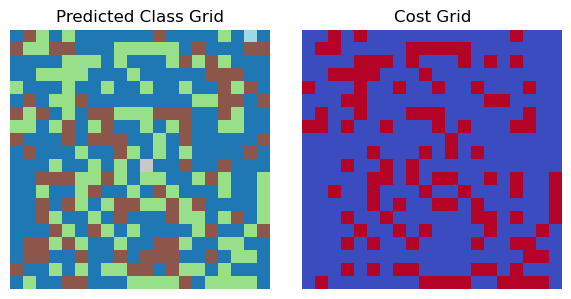

In [62]:
# test on one forest training image
sample = forest_data[0]

img      = sample["image"]
velocity = sample["velocity"]
terrain  = "forest"

# --- Predict grid + build cost ---
class_grid = predict_class_grid(img, terrain)
cost_grid  = build_cost_grid_general(class_grid, velocity, terrain)

# --- Safe start/goal detection ---
start, goal = find_start_goal_safe(class_grid, velocity)

# --- Run pathfinding ---
path, total_cost = dijkstra(cost_grid, start, goal)

# --- Display summary ---
print("🌲 FOREST TERRAIN TEST")
print("Start:", start)
print("Goal :", goal)
print("Path length:", len(path))
print("Total cost :", total_cost)

# --- Optional: visualize the grid and path ---
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1)
plt.imshow(class_grid, cmap="tab20")
plt.title("Predicted Class Grid")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cost_grid, cmap="coolwarm")
plt.title("Cost Grid")
plt.axis("off")

plt.tight_layout()
plt.show()



Chosen terrain : desert
Image ID       : 0006



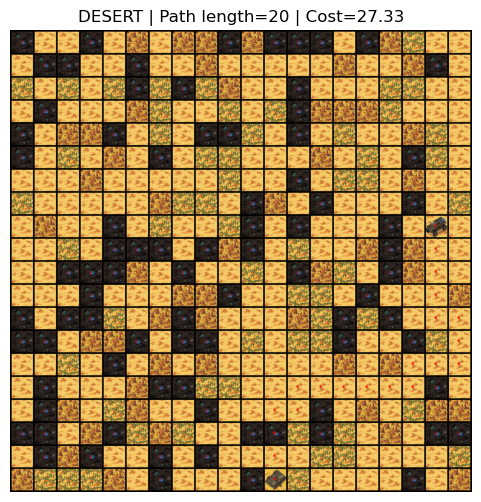

In [63]:
import random
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# FIX ISOLATED START / GOAL (OPTIONAL SAFETY)
# =========================================================
def fix_start_goal_isolation(class_grid, start, goal):
    """Ensure start/goal are not boxed in by walls."""
    for (x, y) in [start, goal]:
        for dx, dy in [(-1,0),(1,0),(0,-1),(0,1)]:
            nx, ny = x+dx, y+dy
            if 0 <= nx < 20 and 0 <= ny < 20:
                if class_grid[nx, ny] == 1:  # wall
                    class_grid[nx, ny] = 0
    return class_grid


# =========================================================
# PICK RANDOM TRAIN IMAGE
# =========================================================
terrain_choice = random.choice(["desert", "forest", "lab"])

if terrain_choice == "desert":
    sample = random.choice(desert_data)
    tile_model = desert_tile_model
elif terrain_choice == "forest":
    sample = random.choice(forest_data)
    tile_model = forest_tile_model
else:
    sample = random.choice(lab_data)
    tile_model = lab_tile_model

img        = sample["image"]
velocity   = sample["velocity"]
true_grid  = sample["grid"]

print("\n==============================")
print("Chosen terrain :", terrain_choice)
print("Image ID       :", sample['image_id'])
print("==============================\n")


# =========================================================
# PREDICT CLASS GRID
# =========================================================
tile_size = img.shape[0] // 20
class_grid = np.zeros((20,20), dtype=int)

for i in range(20):
    for j in range(20):
        tile = img[
            i*tile_size:(i+1)*tile_size,
            j*tile_size:(j+1)*tile_size
        ]
        mean_rgb = tile.mean(axis=(0,1))
        std_rgb  = tile.std(axis=(0,1))

        if terrain_choice == "lab":
            gray = np.mean(tile, axis=2)
            feat = np.concatenate([mean_rgb, std_rgb, [gray.mean(), gray.std()]])
        else:
            feat = np.concatenate([mean_rgb, std_rgb])

        class_grid[i,j] = tile_model.predict(feat.reshape(1,-1))[0]


# =========================================================
# SAFE START / GOAL + COST GRID + PATH
# =========================================================
true_start = tuple(np.argwhere(true_grid == 3)[0])
true_goal  = tuple(np.argwhere(true_grid == 4)[0])

start, goal = find_start_goal_safe(class_grid, velocity)
class_grid = fix_start_goal_isolation(class_grid, start, goal)

cost_grid = build_cost_grid_general(class_grid, velocity, terrain_choice)
path, total_cost = dijkstra(cost_grid, start, goal)


# =========================================================
# VISUALIZATION
# =========================================================
coords = [start]
x, y = start
for m in path:
    if m == 'u': x -= 1
    if m == 'd': x += 1
    if m == 'l': y -= 1
    if m == 'r': y += 1
    coords.append((x, y))

overlay = img.copy()
for (i,j) in coords:
    cx = j*tile_size + tile_size//2
    cy = i*tile_size + tile_size//2
    overlay[cy-3:cy+3, cx-3:cx+3] = [255, 0, 0]

plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.title(f"{terrain_choice.upper()} | Path length={len(path)} | Cost={total_cost:.2f}")
plt.axis("off")
plt.show()


In [64]:
import os
import json
import time
import numpy as np
import pandas as pd
import cv2
from collections import Counter

# =========================================================
# FINAL SUBMISSION WITH PROGRESS LOGS
# =========================================================

BASE = r"C:\Users\telso\Downloads\the-blind-flight-synapse-drive-ps-1\SynapseDrive_Dataset"
TEST_IMG_DIR = f"{BASE}/test/images"
TEST_VEL_DIR = f"{BASE}/test/velocities"

test_files = sorted([f for f in os.listdir(TEST_IMG_DIR) if f.endswith(".png")])
results = []

print(f"🚀 Starting full test inference on {len(test_files)} images...\n")

# --- Timing ---
overall_start = time.time()
terrain_times, tile_times, dijkstra_times = [], [], []

for idx, fname in enumerate(test_files):
    step_start = time.time()
    image_id = fname.replace(".png", "")

    print(f"\n===============================")
    print(f"🖼️ Processing image {idx+1}/{len(test_files)} → {image_id}")
    print(f"===============================")

    # ---------- LOAD IMAGE ----------
    print("📥 Loading image and velocity ...", end=" ")
    img = cv2.imread(os.path.join(TEST_IMG_DIR, fname))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    with open(os.path.join(TEST_VEL_DIR, image_id + ".json"), "r") as f:
        velocity = np.array(json.load(f)["boost"], dtype=np.float32)
    print("✅ Done.")

    # ---------- TERRAIN INFERENCE ----------
    print("🌍 Inferring terrain type ...", end=" ")
    terrain_start = time.time()
    mean_rgb = img.mean(axis=(0, 1))
    std_rgb  = img.std(axis=(0, 1))
    feat = np.concatenate([mean_rgb, std_rgb]).reshape(1, -1)
    terrain = terrain_model.predict(feat)[0]
    terrain_times.append(time.time() - terrain_start)
    print(f"{terrain.upper()} ✅")

    if terrain == "desert":
        tile_model = desert_tile_model
    elif terrain == "forest":
        tile_model = forest_tile_model
    else:
        tile_model = lab_tile_model

    # ---------- TILE PREDICTION ----------
    print("🔍 Predicting 20×20 tile classes ...", end=" ")
    tile_start = time.time()
    tile_size = img.shape[0] // 20
    feats = []

    for i in range(20):
        for j in range(20):
            tile = img[i*tile_size:(i+1)*tile_size, j*tile_size:(j+1)*tile_size]
            mean_rgb = tile.mean(axis=(0,1))
            std_rgb  = tile.std(axis=(0,1))
            if terrain == "lab":
                gray = np.mean(tile, axis=2)
                feat = np.concatenate([mean_rgb, std_rgb, [gray.mean(), gray.std()]])
            else:
                feat = np.concatenate([mean_rgb, std_rgb])
            feats.append(feat)

    class_grid = tile_model.predict(np.array(feats)).reshape(20, 20)
    tile_times.append(time.time() - tile_start)
    print("✅ Done.")

    # ---------- SAFE START / GOAL ----------
    print("🎯 Locating start/goal safely ...", end=" ")
    def find_safe(class_grid, target):
        pos = np.argwhere(class_grid == target)
        if len(pos): return tuple(pos[0])
        walkable = np.argwhere(class_grid != 1)
        k = np.random.randint(len(walkable))
        return tuple(walkable[k])

    start = find_safe(class_grid, 3)
    goal  = find_safe(class_grid, 4)
    print(f"Start={start}, Goal={goal} ✅")

    # ---------- COST GRID ----------
    print("🧮 Building cost grid ...", end=" ")
    base = BASE_COSTS[terrain]
    cost_grid = np.zeros((20, 20))
    for k, v in base.items():
        cost_grid[class_grid == k] = v
    cost_grid -= 0.8 * velocity
    cost_grid = np.clip(cost_grid, 0.5, 1e8)
    print("✅ Done.")

    # ---------- PATH PLANNING ----------
    print("🧭 Running Dijkstra pathfinding ...", end=" ")
    dijkstra_start = time.time()
    path, _ = dijkstra(cost_grid, start, goal)
    dijkstra_times.append(time.time() - dijkstra_start)

    if not path:
        print("\n⚠️  Dijkstra failed → fallback straight path")
        sx, sy = start
        gx, gy = goal
        p = []
        while sy < gy: p.append('r'); sy += 1
        while sy > gy: p.append('l'); sy -= 1
        while sx < gx: p.append('d'); sx += 1
        while sx > gx: p.append('u'); sx -= 1
        path = ''.join(p) or "u"
    print(f"✅ Path length={len(path)}")

    results.append({"image_id": image_id, "path": path})

    # ---------- STATS ----------
    elapsed = time.time() - step_start
    print(f"⏱️ Done in {elapsed:.2f}s")

    # Print summary every 100 images
    if (idx + 1) % 100 == 0 or (idx + 1) == len(test_files):
        avg_total = (time.time() - overall_start) / (idx + 1)
        print(f"\n📊 Progress: {idx+1}/{len(test_files)} images done | Avg {avg_total:.3f}s/image")

# =========================================================
# SAVE SUBMISSION
# =========================================================
ts = int(time.time())
filename = f"submission_verbose_{ts}.csv"
pd.DataFrame(results).to_csv(filename, index=False)

# =========================================================
# FINAL SUMMARY
# =========================================================
print("\n✅ Inference completed successfully.")
print(f"📁 Submission saved as {filename}")
print(f"⏱️ Average times → Terrain: {np.mean(terrain_times):.3f}s | Tile: {np.mean(tile_times):.3f}s | Pathfinding: {np.mean(dijkstra_times):.3f}s")
print(f"🕒 Total runtime: {(time.time() - overall_start)/60:.2f} min")


🚀 Starting full test inference on 10000 images...


🖼️ Processing image 1/10000 → 0001
📥 Loading image and velocity ... ✅ Done.
🌍 Inferring terrain type ... FOREST ✅
🔍 Predicting 20×20 tile classes ... ✅ Done.
🎯 Locating start/goal safely ... Start=(np.int64(15), np.int64(11)), Goal=(np.int64(0), np.int64(9)) ✅
🧮 Building cost grid ... ✅ Done.
🧭 Running Dijkstra pathfinding ... ✅ Path length=19
⏱️ Done in 0.25s

🖼️ Processing image 2/10000 → 0002
📥 Loading image and velocity ... ✅ Done.
🌍 Inferring terrain type ... DESERT ✅
🔍 Predicting 20×20 tile classes ... ✅ Done.
🎯 Locating start/goal safely ... Start=(np.int64(0), np.int64(18)), Goal=(np.int64(3), np.int64(13)) ✅
🧮 Building cost grid ... ✅ Done.
🧭 Running Dijkstra pathfinding ... ✅ Path length=14
⏱️ Done in 0.32s

🖼️ Processing image 3/10000 → 0003
📥 Loading image and velocity ... ✅ Done.
🌍 Inferring terrain type ... LAB ✅
🔍 Predicting 20×20 tile classes ... ✅ Done.
🎯 Locating start/goal safely ... Start=(np.int64(3), np.int64(6))